In [242]:
# Initial Imports
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
from pathlib import Path
import regex as re
import nltk
from datetime import date
import hvplot.pandas  # noqa
import hvplot.dask  # noqa
import twint
import nest_asyncio
nest_asyncio.apply()
nltk.download('stopwords')

%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/kevinwalsh/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [243]:
# Initialize set of inputs
# List of Stocks
stocks = ['microsoft','sony','pfizer','regeneron','moderna']

# Set up Date range
import datetime
from dateutil.relativedelta import relativedelta

today = datetime.date.today()
end_time = today.strftime('%Y-%m-%d %H:%M:%S')
start_time = today + relativedelta(days=-3)
start_time = start_time.strftime('%Y-%m-%d %H:%M:%S')
print(start_time)

2021-01-20 00:00:00


In [244]:
# Define Empty DataFrames
stock_df = pd.DataFrame()
df = pd.DataFrame()

In [245]:
# Define data_crawlers function
def data_crawlers(stock):
    c = twint.Config()
    c.Search = stock
    c.Hide_output = True
    c.Limit = 1000 
    #c.Store_csv = True
    c.Since = start_time
    c.Until = end_time
    #c.Output = f"{stock}.csv"
    c.Pandas = True
    c.Pandas_au = True
    twint.run.Search(c)
    df = twint.storage.panda.Tweets_df
    df.index=idx_microsoft=pd.MultiIndex.from_tuples([tuple([stock, i]) for i in range(len(df.index))])
    return df

In [246]:
### Deploy data_crawlers function on stocks list
for i in stocks: 
    data_crawlers(i)
    df = twint.storage.panda.Tweets_df
    stock_df = stock_df.append(df)

[!] No more data! Scraping will stop now.
found 0 deleted tweets in this search.


In [247]:
stock_df.head()

cashtags      conversation_id    created_at                 date  \
microsoft 0       []  1351895267969294337  1.611152e+12  2021-01-20 09:16:59   
          1       []  1351896480886517761  1.611152e+12  2021-01-20 09:16:52   
          2       []  1351866461120131073  1.611152e+12  2021-01-20 09:16:46   
          3       []  1351893383275540481  1.611152e+12  2021-01-20 09:16:46   
          4       []  1351896450746241026  1.611152e+12  2021-01-20 09:16:45   

             day geo hashtags hour                   id language  ...  \
microsoft 0    3           []   09  1351896508224970755       es  ...   
          1    3           []   09  1351896480886517761       en  ...   
          2    3           []   09  1351896455590633474       en  ...   
          3    3           []   09  1351896453644496896       en  ...   
          4    3           []   09  1351896450746241026       es  ...   

            trans_src translate  \
microsoft 0                       
          1                       
          2                       
          3                       
          4                       

                                                         tweet  \
microsoft 0  Y por si todo esto fuera poco;  En este campo ...   
          1  Let's get Sarah ( @TechieLass ) to 1000 subscr...   
          2  @colincodesdotpy @Microsoft I don't know. I ki...   
          3  -Honda signed on the Microsoft/Cruise collab t...   
          4  Pillada a Microsoft: La cuenta de Xbox Game Pa...   

                                                          urls  \
microsoft 0                                                 []   
          1                     [https://youtu.be/HIGyNNCIH40]   
          2                                                 []   
          3                                                 []   
          4  [https://generacionxbox.com/cuenta-xbox-game-p...   

                         user_id          user_id_str user_rt user_rt_id  \
microsoft 0  1057248206642384896  1057248206642384896                      
          1             14763707             14763707                      
          2            225472726            225472726                      
          3   884554199639437314   884554199639437314                      
          4           1460169660           1460169660                      

                   username video  
microsoft 0    N_Trastamara     0  
          1        rdtechie     0  
          2      0x0B16DA7E     0  
          3     doobielusky     0  
          4  GeneracionXbox     0  

[5 rows x 38 columns]

In [248]:
for col in stock_df.columns:
    print(col)

cashtags
conversation_id
created_at
date
day
geo
hashtags
hour
id
language
link
name
near
nlikes
nreplies
nretweets
photos
place
quote_url
reply_to
retweet
retweet_date
retweet_id
search
source
thumbnail
timezone
trans_dest
trans_src
translate
tweet
urls
user_id
user_id_str
user_rt
user_rt_id
username
video


In [249]:
# Read tweets as strings
stock_df['tweet'] = stock_df['tweet'].astype(str)

# Filter on english tweets
stock_df = stock_df.loc[stock_df['language'] == 'en']
stock_df.head()

cashtags      conversation_id    created_at                 date  \
microsoft 1       []  1351896480886517761  1.611152e+12  2021-01-20 09:16:52   
          2       []  1351866461120131073  1.611152e+12  2021-01-20 09:16:46   
          3       []  1351893383275540481  1.611152e+12  2021-01-20 09:16:46   
          7       []  1351896317199577090  1.611152e+12  2021-01-20 09:16:13   
          9       []  1351896271611592707  1.611152e+12  2021-01-20 09:16:02   

             day geo              hashtags hour                   id language  \
microsoft 1    3                        []   09  1351896480886517761       en   
          2    3                        []   09  1351896455590633474       en   
          3    3                        []   09  1351896453644496896       en   
          7    3      [mirirod, microsoft]   09  1351896317199577090       en   
          9    3                        []   09  1351896271611592707       en   

             ... trans_src translate  \
microsoft 1  ...                       
          2  ...                       
          3  ...                       
          7  ...                       
          9  ...                       

                                                         tweet  \
microsoft 1  Let's get Sarah ( @TechieLass ) to 1000 subscr...   
          2  @colincodesdotpy @Microsoft I don't know. I ki...   
          3  -Honda signed on the Microsoft/Cruise collab t...   
          7  In addition to Brand Storytelling, Miri Rodrig...   
          9  Microsoft killed the Zune, but Zune-heads are ...   

                                                          urls  \
microsoft 1                     [https://youtu.be/HIGyNNCIH40]   
          2                                                 []   
          3                                                 []   
          7                           [https://bit.ly/3qvz7o9]   
          9  [https://www.theverge.com/22238668/microsoft-z...   

                         user_id          user_id_str user_rt user_rt_id  \
microsoft 1             14763707             14763707                      
          2            225472726            225472726                      
          3   884554199639437314   884554199639437314                      
          7             17974644             17974644                      
          9  1106569952365080576  1106569952365080576                      

                  username video  
microsoft 1       rdtechie     0  
          2     0x0B16DA7E     0  
          3    doobielusky     0  
          7  vincemenzione     1  
          9    abouttechio     1  

[5 rows x 38 columns]

In [250]:
# Reformat Date
stock_df['date'] = [x[:10] for x in stock_df['date']]
# Reset Index
stock_df.reset_index(inplace=True)
# Drop Superfluous Column
stock_df = stock_df.drop(columns='level_1')
stock_df = stock_df.rename(columns={'level_0':'Stock'})

stock_df.head()

,Stock,cashtags,conversation_id,created_at,date,day,geo,hashtags,hour,id,...,trans_src,translate,tweet,urls,user_id,user_id_str,user_rt,user_rt_id,username,video
0,microsoft,[],1351896480886517761,1.611152e+12,2021-01-20,3,,[],09,1351896480886517761,...,,,Let's get Sarah ( @TechieLass ) to 1000 subscr...,[https://youtu.be/HIGyNNCIH40],14763707,14763707,,,rdtechie,0
1,microsoft,[],1351866461120131073,1.611152e+12,2021-01-20,3,,[],09,1351896455590633474,...,,,@colincodesdotpy @Microsoft I don't know. I ki...,[],225472726,225472726,,,0x0B16DA7E,0
2,microsoft,[],1351893383275540481,1.611152e+12,2021-01-20,3,,[],09,1351896453644496896,...,,,-Honda signed on the Microsoft/Cruise collab t...,[],884554199639437314,884554199639437314,,,doobielusky,0
3,microsoft,[],1351896317199577090,1.611152e+12,2021-01-20,3,,"[mirirod, microsoft]",09,1351896317199577090,...,,,"In addition to Brand Storytelling, Miri Rodrig...",[https://bit.ly/3qvz7o9],17974644,17974644,,,vincemenzione,1
4,microsoft,[],1351896271611592707,1.611152e+12,2021-01-20,3,,[],09,1351896271611592707,...,,,"Microsoft killed the Zune, but Zune-heads are ...",[https://www.theverge.com/22238668/microsoft-z...,1106569952365080576,1106569952365080576,,,abouttechio,1


In [251]:
# Reset the Index to be both Date and Stock
stock_df = stock_df.filter(['date','Stock','tweet','nretweets','nlikes','nreplies'],axis=1)
stock_df.tail()

,date,Stock,tweet,nretweets,nlikes,nreplies
5630,2021-01-21,moderna,State officials say it's safe to resume vaccin...,0,0,0
5631,2021-01-21,moderna,Grateful to have received dose number one of t...,0,2,1
5632,2021-01-21,moderna,Got my second round of the Moderna vaccine thi...,0,1,1
5633,2021-01-21,moderna,@murderxbryan They gotta continue playing ball...,0,3,1
5634,2021-01-21,moderna,@LBHealthDept I had first vaccine (Moderna) at...,0,0,0


# Sentiment Analysis

In [252]:
# Create a Master copy of the stock_df
master_df = stock_df.copy()
master_df = master_df.reset_index()

# Perform Sentiment Analysis
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import WordNetLemmatizer 
analyzer = SentimentIntensityAnalyzer()
tweet_sent = {'Compound':[],
                 'Negative':[],
                 'Neutral':[],
                 'Positive':[]}
# Get sentiment from tweets
for index, row in master_df.iterrows():
    try:
        tweet_sentiment = analyzer.polarity_scores(row["tweet"])
        tweet_sent["Compound"].append(tweet_sentiment["compound"])
        tweet_sent["Negative"].append(tweet_sentiment["neg"])
        tweet_sent["Neutral"].append(tweet_sentiment["neu"])
        tweet_sent["Positive"].append(tweet_sentiment["pos"])
    except AttributeError:
        pass
# Add the newly created scores to the previously created dataframe
tweet_sent_df = pd.DataFrame(tweet_sent)
master_df = tweet_sent_df.join(master_df)
master_df.head()

,Compound,Negative,Neutral,Positive,index,date,Stock,tweet,nretweets,nlikes,nreplies
0,0.0000,0.000,1.000,0.000,0,2021-01-20,microsoft,Let's get Sarah ( @TechieLass ) to 1000 subscr...,3,2,0
1,0.4135,0.040,0.862,0.098,1,2021-01-20,microsoft,@colincodesdotpy @Microsoft I don't know. I ki...,0,1,0
2,0.0000,0.000,1.000,0.000,2,2021-01-20,microsoft,-Honda signed on the Microsoft/Cruise collab t...,0,0,0
3,0.7906,0.077,0.681,0.242,3,2021-01-20,microsoft,"In addition to Brand Storytelling, Miri Rodrig...",2,1,0
4,-0.4118,0.216,0.784,0.000,4,2021-01-20,microsoft,"Microsoft killed the Zune, but Zune-heads are ...",0,0,0


In [253]:
# Create a dataframe of individual stocks
dataframes = list()
for i in stocks:
    globals()[f"{i}_dataframe"] = master_df[master_df['Stock'] == i].reset_index(drop=True)
    #dataframes.append(df[df['Stock'] == i].reset_index())
    dataframes.append(globals()[f"{i}_dataframe"])

# Tokenizer

In [254]:
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from string import punctuation
import re

In [255]:
# Clean the Tweet Function
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
def clean_text(text):
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text. substitute the matched string in REPLACE_BY_SPACE_RE with space.
    text = BAD_SYMBOLS_RE.sub('', text) # remove symbols which are in BAD_SYMBOLS_RE from text. substitute the matched string in BAD_SYMBOLS_RE with nothing. 
    text = text.replace('x', '')
 # text = ' '.join(word for word in text.split() if word not in STOPWORDS) # remove stopwors from text
    return text

In [256]:
# Apply to the dataframes
for x in dataframes:
    x['tweet'] = x['tweet'].apply(clean_text)

In [257]:
# Tokenizer function
sw = set(stopwords.words('english'))
sw_addon = ['https','tco','ps']
sw = sw.union(sw_addon)
def tokenizer(text):
    """Tokenizes text."""
    words = []
    # Remove the puntcuation
    regex = re.compile("[^a-zA-Z ]")
    re_clean = regex.sub('', str(text))
    words = word_tokenize(re_clean)
    tokens = [word.lower() for word in words if word.lower() not in sw]
    return tokens

In [258]:
# Apply to DataFrames
for x in dataframes:
    x['tokens'] = x['tweet'].apply(tokenizer)

# Frequency Analysis

In [259]:
from collections import Counter
from nltk import ngrams

In [260]:
# Counter
counts = {}
for x in stocks:
    counts[x] = Counter(ngrams(tokenizer(globals()[f"{x}_dataframe"]['tweet'].str.cat()),n=2))

In [261]:
# Define function to count the top 10 word pairs
def pair_count(words, N=10):
    """Returns the top N tokens from the frequency count"""
    return Counter(words).most_common(N)

In [262]:
for x in stocks:
    globals()[f'{x}_count'] = dict(pair_count(counts[x]))
    globals()[f'{x}_count'] = pd.DataFrame(list(globals()[f'{x}_count'].items()),columns=['Pairs','Count'])
    globals()[f'{x}_count'] = globals()[f'{x}_count'].hvplot.table(columns=['Pairs', 'Count'], width=400)

# Word Clouds

In [263]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
plt.style.use('Solarize_Light2')
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = [20.0, 10.0]

In [264]:
# Generate word clouds
for x in stocks:
    globals()[f'{x}_wc'] = WordCloud().generate(' '.join(tokenizer(globals()[f'{x}_dataframe']['tweet'].str.cat()))) 

# Named Recognition

In [265]:
import spacy
from spacy import displacy

In [266]:
# Load the spaCy model
nlp = spacy.load('en_core_web_sm')

In [267]:
# Create the NER Variables for each of the stocks
for x in stocks:
    globals()[f'{x}_ner'] = nlp(globals()[f'{x}_dataframe']['tweet'].str.cat())


# Histograms

In [268]:
# Distribution of Compound Score
for x in stocks:
    globals()[f'{x}_hist'] = globals()[f'{x}_dataframe'].hvplot.hist(y='Compound',title=f'{x} Distribution of Negative to Positive Tweets')

# Bar Graph

In [269]:
for x in stocks:
    globals()[f'{x}_bar'] = globals()[f'{x}_dataframe'].hvplot.bar(x='date',y='nreplies',rot=90)

# General Sentiment Analysis

In [270]:
for x in stocks:
    globals()[f'{x}_sentiment'] = globals()[f'{x}_dataframe']['Compound'].mean()

In [271]:
for x in stocks:
    sentiment = globals()[f'{x}_sentiment']
    if sentiment < 0:
        print(f'Over the past year, the general social media discussion for {x} has been negative')
    elif sentiment == 0:
        print(f'Over the past year, the general social media discussion for {x} has been neutral')
    else:
        print(f'Over the past year, the general social media discussion for {x} has been positive')

Over the past year, the general social media discussion for microsoft has been positive
Over the past year, the general social media discussion for sony has been positive
Over the past year, the general social media discussion for pfizer has been positive
Over the past year, the general social media discussion for regeneron has been positive
Over the past year, the general social media discussion for moderna has been positive


# Creating a Dashboard

In [272]:
# Creating rows of the Top 10 and the word cloud
import pandas as pd
import numpy as np
from pathlib import Path
import panel as pn
from panel.interact import interact
import plotly.express as px
pn.extension('plotly')

In [273]:
# Create Top 10 Row
for x in stocks:
    globals()[f'{x}_10_row'] = pn.Row(globals()[f'{x}_count'],globals()[f'{x}_hist'],globals()[f'{x}_bar'])


In [274]:
tabs = pn.Tabs(("microsoft",microsoft_10_row),
              ("sony",sony_10_row),
              ("pfizer",pfizer_10_row),
               ("moderna",moderna_10_row),
               ('regeneron',regeneron_10_row))

In [275]:
tabs

Tabs
    [0] Row
        [0] HoloViews(Table)
        [1] HoloViews(Histogram)
        [2] HoloViews(Bars)
    [1] Row
        [0] HoloViews(Table)
        [1] HoloViews(Histogram)
        [2] HoloViews(Bars)
    [2] Row
        [0] HoloViews(Table)
        [1] HoloViews(Histogram)
        [2] HoloViews(Bars)
    [3] Row
        [0] HoloViews(Table)
        [1] HoloViews(Histogram)
        [2] HoloViews(Bars)
    [4] Row
        [0] HoloViews(Table)
        [1] HoloViews(Histogram)
        [2] HoloViews(Bars)

# Display the Visualizations

In [277]:
# NER
for x in stocks:
    print(f'NER for {x}')
    displacy.render(globals()[f'{x}_ner'], style='ent')

NER for microsoft


NER for sony


NER for pfizer


NER for regeneron


NER for moderna


In [282]:
# Visualization for Histogram
for x in stocks:
    print(f'{x} Compound Distribution')
    display(globals()[f'{x}_hist'])

microsoft Compound Distribution


:Histogram   [Compound]   (Compound_count)

sony Compound Distribution


:Histogram   [Compound]   (Compound_count)

pfizer Compound Distribution


:Histogram   [Compound]   (Compound_count)

regeneron Compound Distribution


:Histogram   [Compound]   (Compound_count)

moderna Compound Distribution


:Histogram   [Compound]   (Compound_count)

microsoft Word Cloud


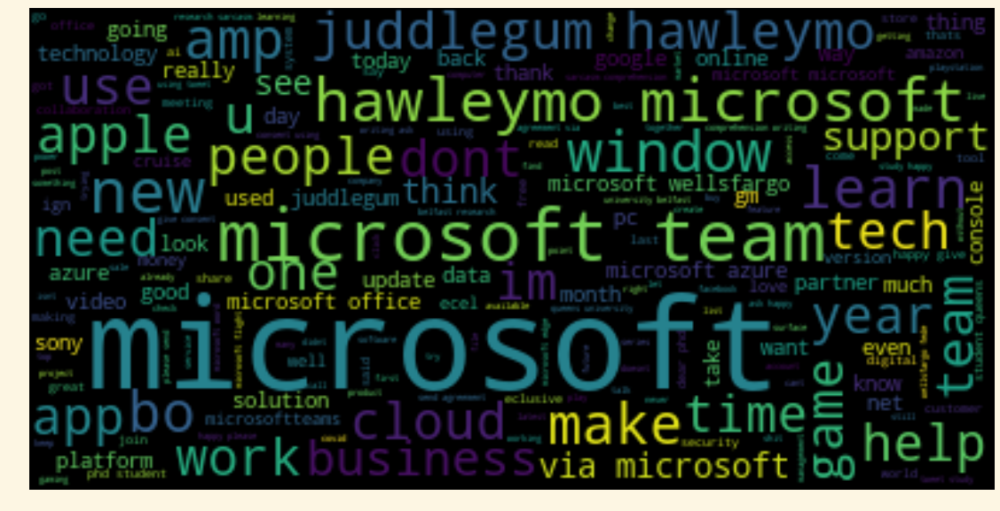

sony Word Cloud


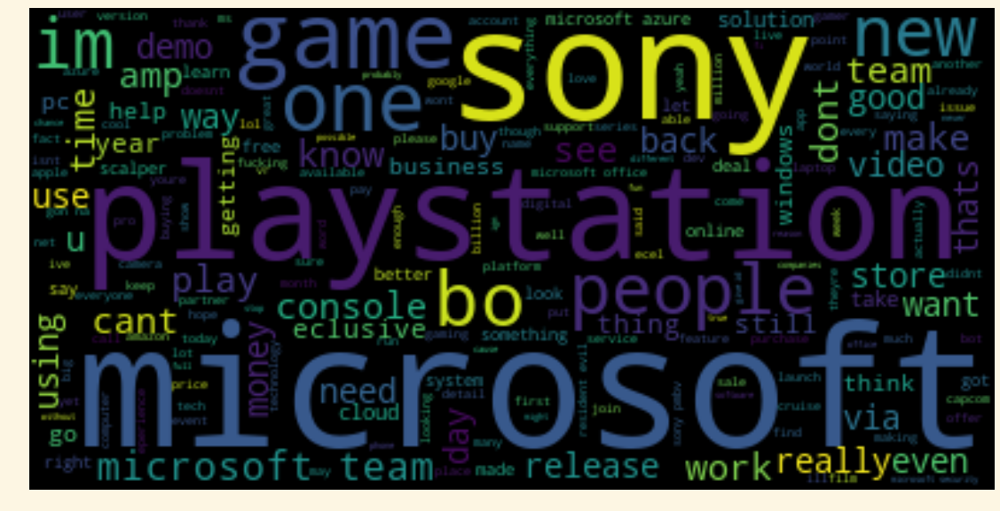

pfizer Word Cloud


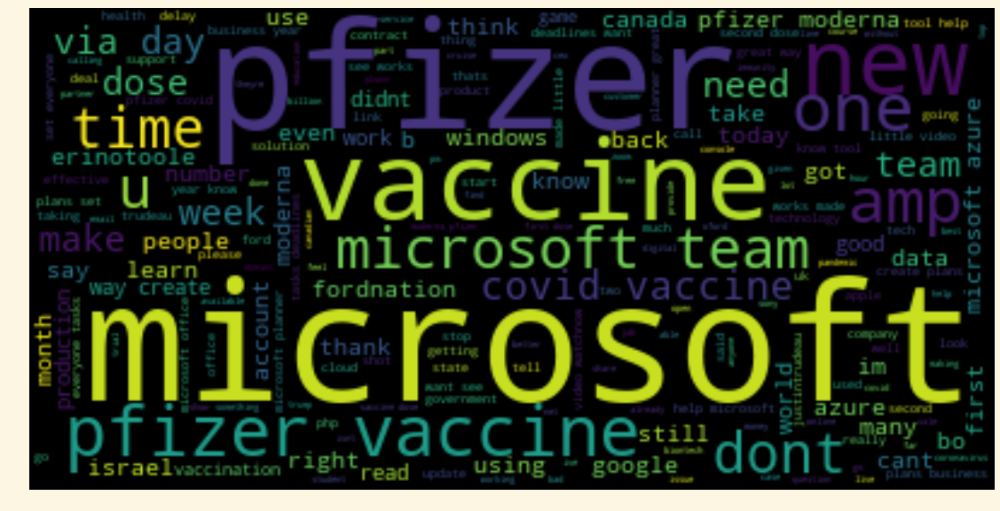

regeneron Word Cloud


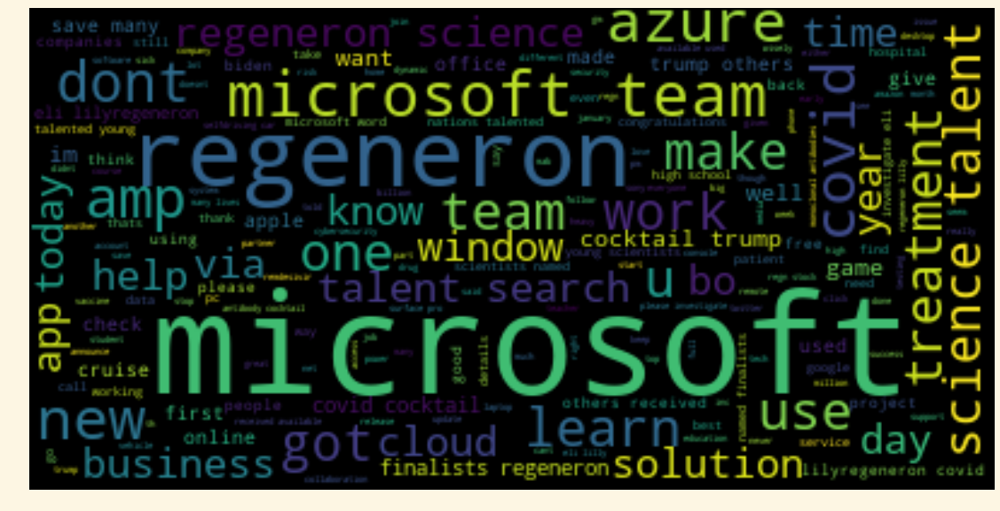

moderna Word Cloud


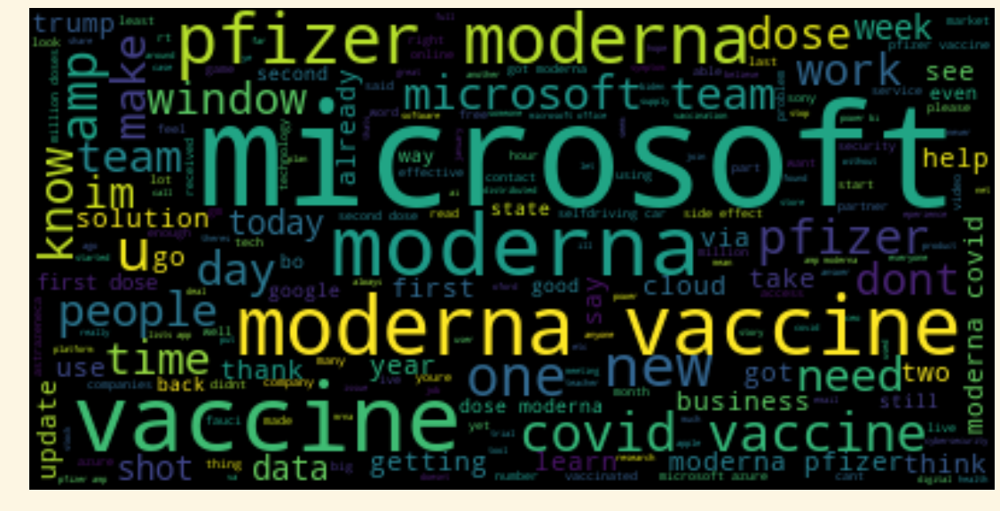

In [285]:
for x in stocks: 
    print(f'{x} Word Cloud')
    plt.imshow(globals()[f'{x}_wc'], interpolation='bilinear')
    plt.axis("off")
    plt.show()